# 第 9 章 图像画风迁移

## 9.2 实现风格转移

### 导入依赖，定义超参数

In [3]:
from typing import List, Tuple

import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from PIL import Image
from IPython import display
from tensorflow.python import keras
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.preprocessing import image as kp_image

plt.rcParams['figure.dpi'] = 180
plt.rcParams['figure.figsize'] = (20, 10)
plt.rcParams['axes.grid'] = False

# 图像路径
STYLE_IMAGE_PATH = 'data/style-tranfer/style/panda.jpg'
CONTENT_IMAGE_PATH = 'data/style-tranfer/content/dog.jpg'

# 内容输出层
CONTENT_LAYERS = [
    'block4_conv2'
]

# 风格输出层
STYLE_LAYERS = [
    'block1_conv1',
    'block2_conv1',
    'block3_conv1',
    'block4_conv1',
    'block5_conv1'
]

NUM_CONTENT_LAYERS = len(CONTENT_LAYERS)
NUM_STYLE_LAYERS = len(STYLE_LAYERS)

### 图像处理方法

In [4]:
def load_image(img_path: str, max_dim: int = 512) -> np.ndarray:
    """加载图像张量

    Args:
        img_path: 图像路径
        max_dim: 图像最大尺寸
    Returns:
        返回图像张量的 Numpy 数组
    """
    img = Image.open(img_path)
    long = max(img.size)
    scale = max_dim / long
    img_tensor = img.resize(
        (round(img.size[0] * scale), round(img.size[1] * scale)), Image.ANTIALIAS)
    img_tensor = kp_image.img_to_array(img_tensor)
    img_tensor = np.expand_dims(img_tensor, axis=0)

    return img_tensor

In [5]:
def image_show(img_tensor: np.ndarray, title=None):
    """展示图片张量

    Args:
        img_tensor: 图像张量
        title: 图像标题
    """
    if len(img_tensor.shape) == 4:
        img_tensor = np.squeeze(img_tensor, axis=0)
    out = img_tensor.astype('uint8')
    plt.imshow(out)
    if title is not None:
        plt.title(title)
        plt.imshow(out)

In [6]:
def load_and_process_img(image_path: str) -> np.ndarray:
    """加载图像张量，并使用 VGG19 模块预处理

    Args:
        image_path: 图像路径
    Returns:
        返回预处理后的图像张量
    """
    img_tensor = load_image(image_path)
    img_tensor = keras.applications.vgg19.preprocess_input(img_tensor)
    return img_tensor

In [7]:
def deprocess_img(processed_img):
    """反预处理操作，vgg19.preprocess_input 方法的逆操作

    Args:
        processed_img: 模型输出的图像
    Returns:
        返回解码后的数据
    """
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)

    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]
    # 由于输出数值可能是负无穷到正无穷的范围内，所以需要截断到 0 - 255 范围
    x = np.clip(x, 0, 255).astype('uint8')
    return x

### 模型定义

In [8]:
def get_model() -> Model:
    """创建提取特征模型

    这个方法加载一个预训练的 VGG19 模型，然后提取我们的目标内容层和风格层
    使用提取的层创建一个新得模型，这个新模型接受图像输入并且输出这个图像在目标层
    中的中间输出
    Returns:
        返回一个输入图像，输出中间层结果的 tf.Keras 模型
    """
    # 加载预训练的 VGG19 网络
    vgg = keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False

    # 从模型中提取风格和内容表示层
    content_outputs = [vgg.get_layer(name).output for name in CONTENT_LAYERS]
    style_outputs = [vgg.get_layer(name).output for name in STYLE_LAYERS]

    model_outputs = content_outputs + style_outputs

    # 构建新模型
    model = Model(vgg.input, model_outputs)
    # 由于我们不训练此模型的参数，设置为不可训练
    for layer in model.layers:
        layer.trainable = False
    return model

### 自定义损失函数

In [9]:
def get_content_loss(content: tf.Tensor, target_content: tf.Tensor) -> tf.Tensor:
    """计算内容损失

    Args:
        content: 基础内容特征
        target_content: 目标内容特征
    Returns:
        返回目标损失
    """
    return tf.reduce_mean(tf.square(content - target_content))

def gram_matrix(input_tensor: tf.Tensor) -> tf.Tensor:
    """计算格拉姆矩阵

    Args:
        input_tensor: 输入张量
    Returns:
        返回计算后的计算格拉姆矩阵
    """
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)

def get_style_loss(style: tf.Tensor, gram_target: tf.Tensor) -> tf.Tensor:
    """计算风格损失

    Args:
        style: 基础风格
        gram_target: 目标风格的格拉姆矩阵
    Returns:
        返回风格损失
    """
    # height, width, channels = style.get_shape().as_list()
    gram_style = gram_matrix(style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def compute_loss(model: Model,
                 generated_image: tf.Variable,
                 gram_style_features,
                 content_features) -> Tuple[tf.Tensor, tf.Tensor, tf.Tensor]:
    """计算损失

    Args:
        model: 我们使用的模型
        generated_image: 生成图像
        gram_style_features: 风格特征（格拉姆矩阵形式）
        content_features: 内容特征
    Returns:
        返回全部损失、风格损失和内容损失
    """

    # 使用模型前向传播。
    # 由于 tf.Keras 的特征，可以直接把模型当成一个方法使用。
    model_outputs = model(generated_image)

    content_output_features = model_outputs[:NUM_CONTENT_LAYERS]
    style_output_features = model_outputs[NUM_CONTENT_LAYERS:]

    style_score = 0
    content_score = 0

    # 这里风格损失权重设置为 0.0001，也可以调成别的值看最终结果
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += get_style_loss(comb_style[0], target_style) * 0.0001

    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += get_content_loss(comb_content[0], target_content)

    # Get total loss
    loss = style_score + content_score
    return loss, style_score, content_score

### 训练循环

In [10]:
def compute_grads(model: Model,
                  generated_image: tf.Variable,
                  gram_style_features: np.ndarray,
                  content_features: np.ndarray) -> Tuple[tf.Tensor, Tuple[tf.Tensor, tf.Tensor, tf.Tensor]]:
    """计算梯度

    Args:
        model: 我们使用的模型
        generated_image: 生成图像，我们优化这个图像
        gram_style_features: 处理后的风格特征
        content_features: 内容特征
    Returns:
        返回计算好的梯度
    """
    with tf.GradientTape() as tape:
        all_loss = compute_loss(model=model,
                                generated_image=generated_image,
                                gram_style_features=gram_style_features,
                                content_features=content_features)
    # Compute gradients wrt input image
    total_loss = all_loss[0]
    grads = tape.gradient(total_loss, generated_image)
    return grads, all_loss

In [11]:
def run_style_transfer(content_path: str,
                       style_path: str,
                       num_iterations: int = 1000):
    """风格迁移主函数

    Args:
        content_path: 内容图像路径
        style_path: 风格图像路径
        num_iterations: 迭代次数
    Returns:
        返回最好的结果图像和20张中间图像
    """
    model = get_model()
    model.summary()

    content_image = load_and_process_img(content_path)
    style_image = load_and_process_img(style_path)

    # 使用内容图像和风格图像前向传播
    content_outputs = model.predict(content_image)
    style_outputs = model.predict(style_image)

    # 从模型输出中提取内容特征和风格特征
    content_features = [
        content_layer[0] for content_layer in content_outputs[:NUM_CONTENT_LAYERS]
        ]
    style_features = [
        style_layer[0] for style_layer in style_outputs[NUM_CONTENT_LAYERS:]
        ]

    gram_style_features = [gram_matrix(feature) for feature in style_features]

    # 使用内容图像初始化一个变量，用于存储生成图像
    generated_image = tf.Variable(content_image, dtype=tf.float32)

    # 定义一个无穷大的损失和一个空变量，用于保存最佳结果
    best_loss, best_img = float('inf'), None

    # 初始化优化器
    optimizer = tf.optimizers.Adam(learning_rate=5,
                                   beta_1=0.99,
                                   epsilon=1e-1)

    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means

    # 保存中间图像的数组
    intermediate_images = []

    for i in range(num_iterations):
        grads, all_loss = compute_grads(model=model,
                                        generated_image=generated_image,
                                        gram_style_features=gram_style_features,
                                        content_features=content_features)

        loss, style_score, content_score = all_loss
        # 根据梯度优化图像，更新生成图像
        optimizer.apply_gradients([(grads, generated_image)])
        clipped = tf.clip_by_value(generated_image, min_vals, max_vals)
        generated_image.assign(clipped)

        # 如果损失下降了，替换最优结果
        if loss < best_loss:
            best_loss = loss
            best_img = deprocess_img(generated_image.numpy())

        # 绘制图像
        plot_step = num_iterations // 20
        if i % plot_step == 0:
            plot_img = generated_image.numpy()
            plot_img = deprocess_img(plot_img)

            intermediate_images.append(plot_img)
            # 清除 Jupyter Cell 之前的结果，然后绘制新图
            display.clear_output(wait=True)
            display.display_png(Image.fromarray(plot_img))
            print(f'Iteration: {i}, loss: {best_loss}')

    return best_img, intermediate_images

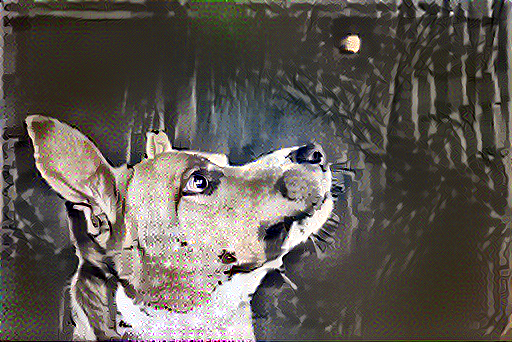

Iteration: 950, loss: 256106.59375


In [12]:
best_img, intermediate_images = run_style_transfer(CONTENT_IMAGE_PATH,
                                                   STYLE_IMAGE_PATH,
                                                   1000)

### 可视化中间过程

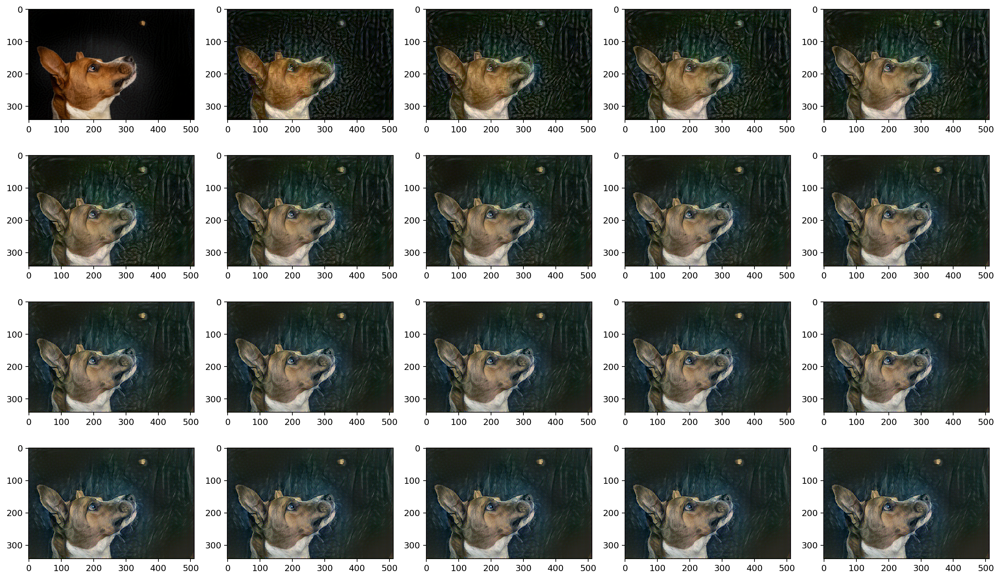

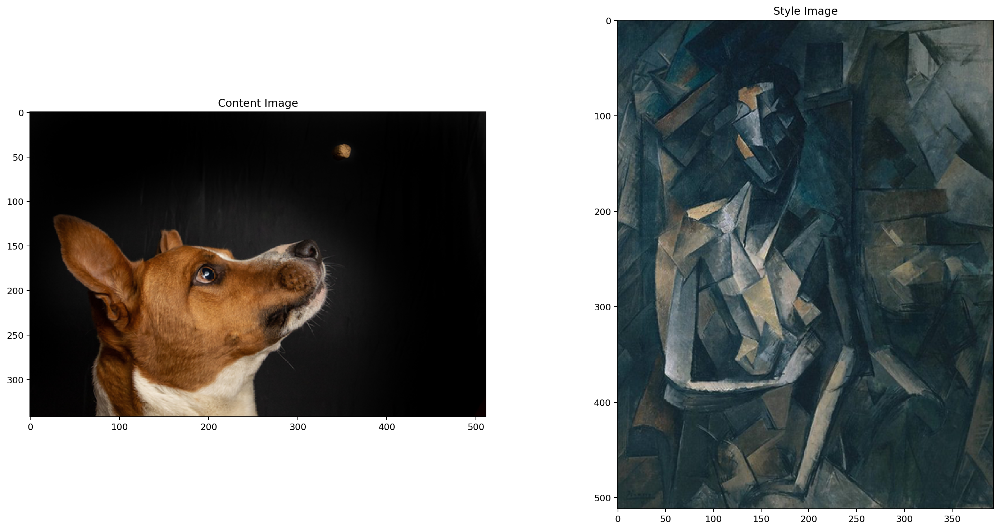

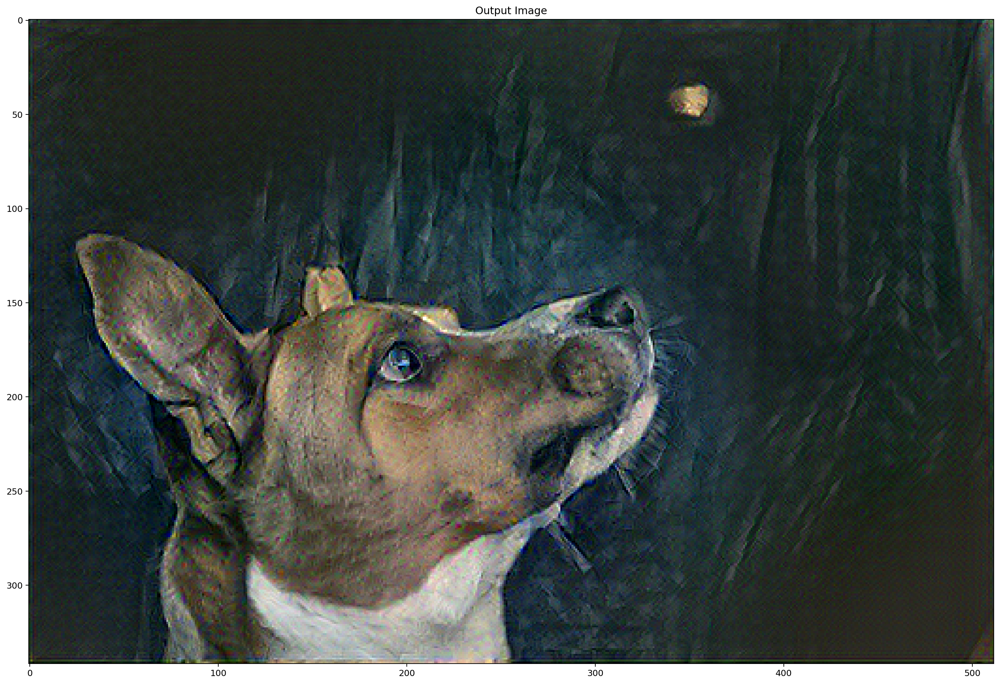

In [24]:
def visualize_results(best_img: np.ndarray,
                      intermediate_images: List[np.ndarray],
                      content_path: str,
                      style_path: str):
    """可视化输入、输出结果和中间过程

    Args:
        best_img: 最佳图像
        intermediate_images: 中间过程图像列表
        content_path: 内容图像路径
        style_path: 风格图像路径
    """
    plt.figure(figsize=(20, 12))
    for index, image in enumerate(intermediate_images):
        plt.subplot(4, 5, index+1)
        plt.imshow(image)
    plt.show()

    content_image = load_image(content_path)
    style_image = load_image(style_path)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)

    image_show(content_image, 'Content Image')

    plt.subplot(1, 2, 2)
    image_show(style_image, 'Style Image')

    plt.figure(figsize=(20, 20))
    plt.imshow(best_img)
    plt.title('Output Image')
    plt.show()

visualize_results(best_img, intermediate_images, CONTENT_IMAGE_PATH, STYLE_IMAGE_PATH)